# Required Packages

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from IPython.display import Image
from scipy.interpolate import UnivariateSpline
%matplotlib inline

# Load Sample Images

In [3]:
img1 = cv2.imread('../image_filter_app/sample_images/ai-generated-8713076_1280.png')
img2 = cv2.imread('../image_filter_app/sample_images/peacock-8693634_1280.jpg')
img3 = cv2.imread('../image_filter_app/sample_images/lighthouse-9073925_1280.png')

### Display Original Image & Filtered Image

In [4]:
def plot(img1, img2):
    fig = plt.figure(figsize = (15,10))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")
    
    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Filtered Image")
    
    plt.show()

## Black & White Filter

In [5]:
# B&W filter function
def bw_filter(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img_gray

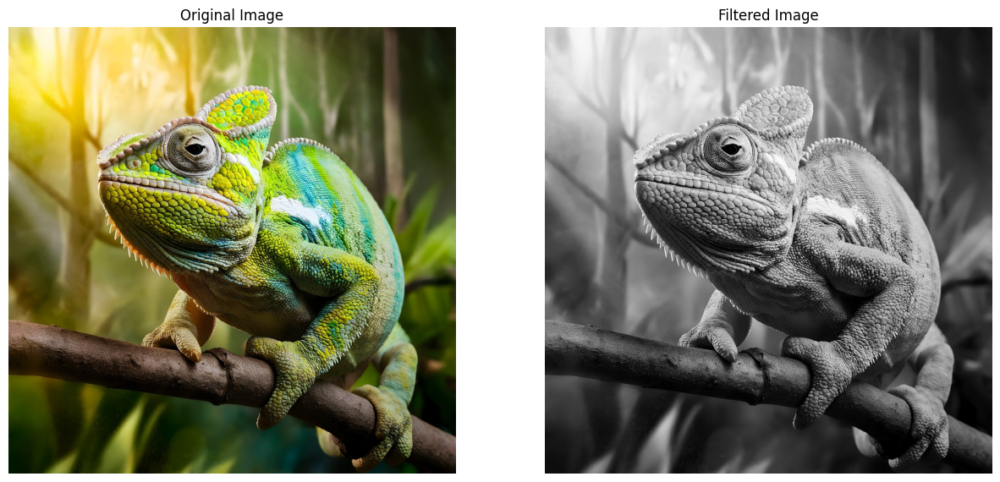

In [6]:
# Test B&W filter
img = img1
img_bw = bw_filter(img)
plot(img, img_bw)

## Sepia / Vintage Filter

In [9]:
# Function to Vintage effect
def sepia(img):
    img_sepia = img.copy()
    img_sepia = cv2.cvtColor(img_sepia, cv2.COLOR_BGR2RGB)
    img_sepia = np.array(img_sepia, dtype = np.float64)
    img_sepia = cv2.transform(img_sepia, np.matrix([[0.393, 0.769, 0.189],
                                                    [0.349, 0.686, 0.168],
                                                    [0.272, 0.534, 0.131]]))
    
    img_sepia = np.clip(img_sepia, 0, 255)
    img_sepia = np.array(img_sepia, dtype = np.uint8)
    img_sepia = cv2.cvtColor(img_sepia, cv2.COLOR_RGB2BGR)
    return img_sepia

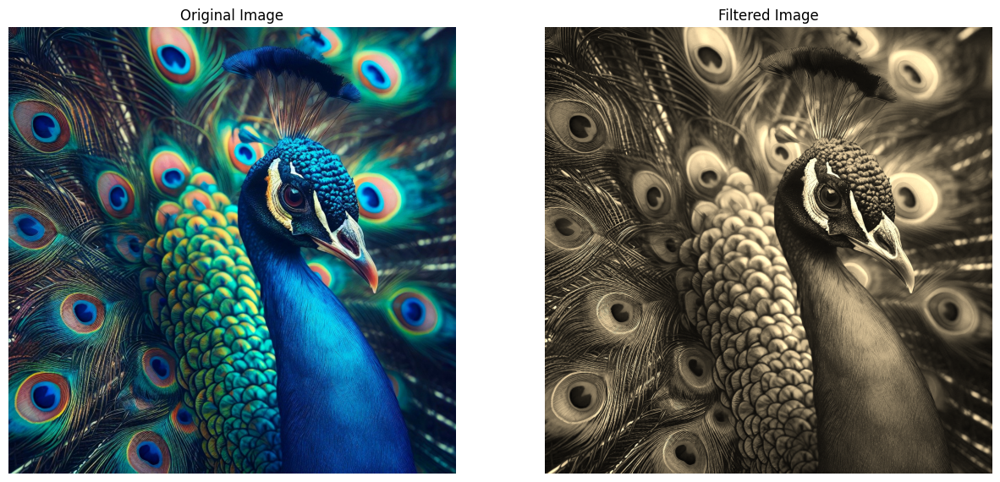

In [12]:
# Test Vintage effect
img = img2
img_sepia = sepia(img)
plot(img, img_sepia)

## Vignette Effect

In [13]:
# Function for vignette effect
def vignette(img, level = 2):
    height, width = img.shape[:2]
    
# Generate vignette mask using Gaussian kernels
    X_resultant_kernel = cv2.getGaussianKernel(width, width/level)
    Y_resultant_kernel = cv2.getGaussianKernel(height, height/level)

# Generating resultant_kernel matrix.
    kernel = Y_resultant_kernel * X_resultant_kernel.T 
    mask = kernel / kernel.max()
    
    img_vignette = np.copy(img)
    
# Applying the mask to each channel in the input image
    for i in range(3):
        img_vignette[:,:,i] = img_vignette[:,:,i] * mask
    
    return img_vignette

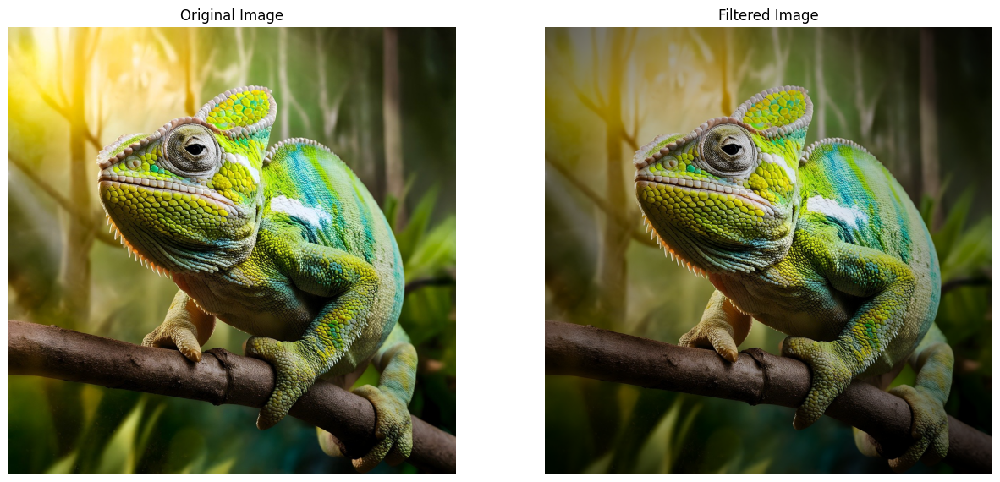

In [14]:
# Test Vignette effect
img = img1
img_vignette = vignette(img)
plot(img, img_vignette)

## Blur Filter

In [26]:
# Function for blur filter
def blur_img(img, k=9):
    blur = cv2.GaussianBlur(img, (k,k), 0, 0)
    return blur

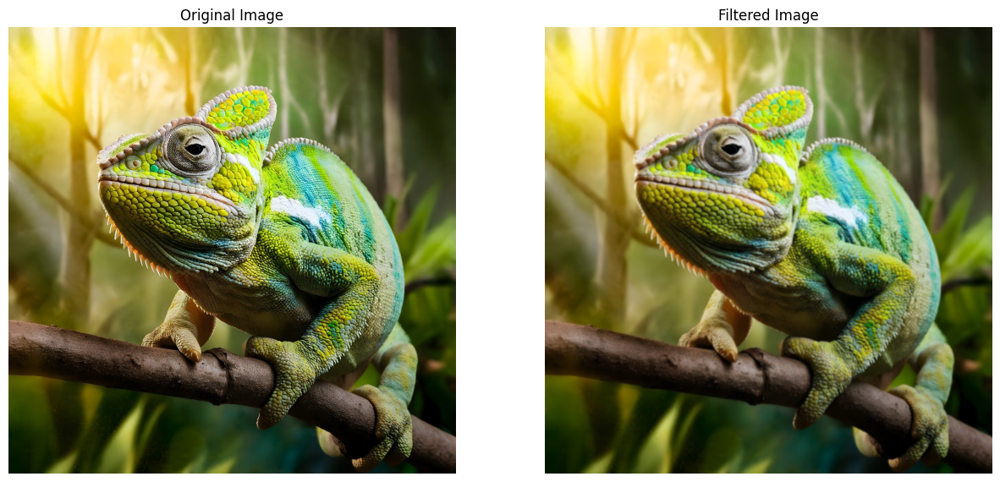

In [27]:
# Test the blur
img = img1
blur_img = blur_img(img)
plot(img, blur_img)

## Canny Edge Detection

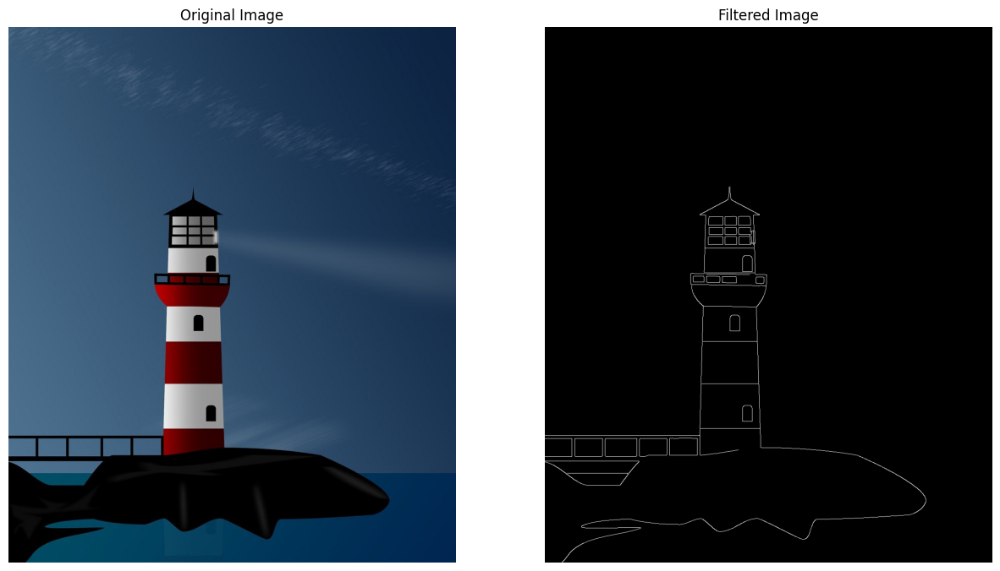

In [31]:
# function for canny edge detection
img = img3
img_edges = cv2.Canny(img, 100, 200)
plot(img, img_edges)

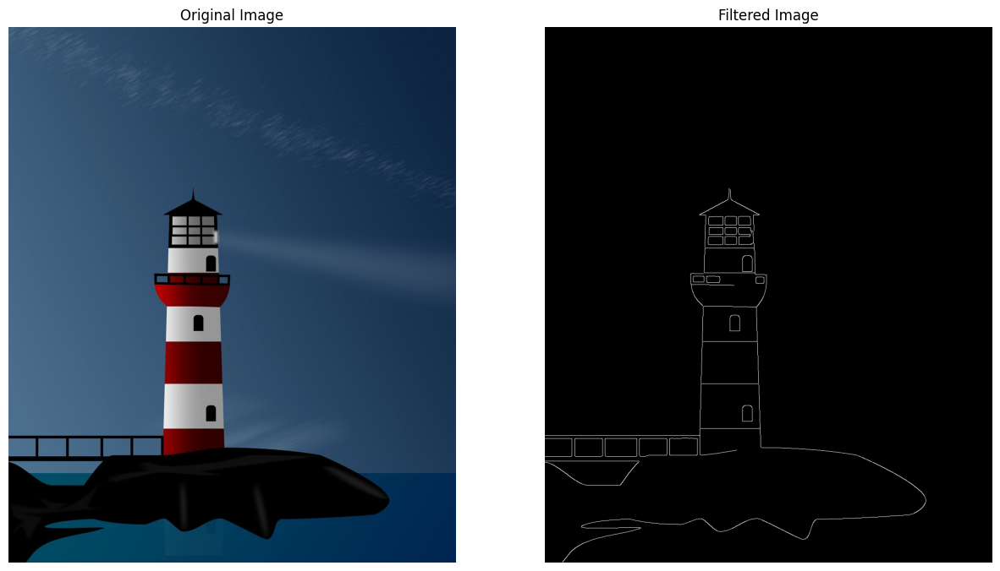

In [32]:
# Canny edge detection with the blur
img = img3
img_blur = cv2.GaussianBlur(img, (5,5), 0, 0)
img_edges = cv2.Canny(img_blur, 100, 200)
plot(img, img_edges)

## Sobel Filter

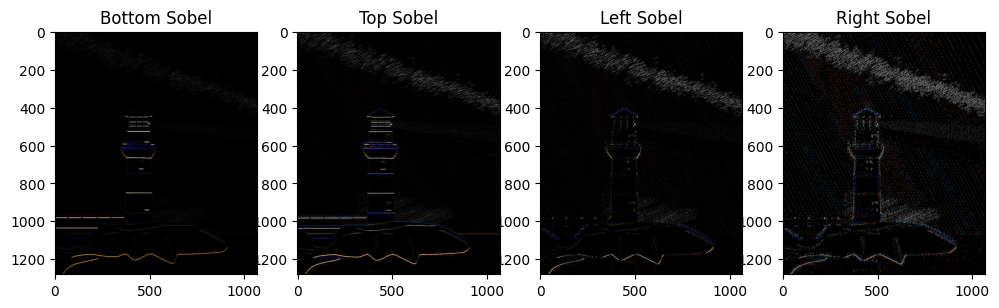

In [35]:
# Sobel Edge Detection

img = img3
# Bottom Sobel Filter
kernel1 = np.array([[-1, -2, -1],
                    [0, 0, 0],
                    [1, 2, 1]])
# Top Sobel Filter
kernel2 = np.array([[1, 2, 1],
                    [0, 0, 0],
                    [-1, -2, -1]])
# Left Sobel Filter
kernel3 = np.array([[1, 0, -1],
                    [2, 0, -2],
                    [1, 0, -1]])
# Right Sobel Filter
kernel4 = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

kernels = [kernel1, kernel2, kernel3, kernel4]
kernel_name = ['Bottom Sobel', 'Top Sobel', 'Left Sobel', 'Right Sobel']

figure, axis = plt.subplots(1,4, figsize=(12,10))
for kernel, name, ax in zip(kernels, kernel_name, axis.flatten()):
     img = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REPLICATE)
     ax.imshow(abs(img), cmap='gray')
     ax.set_title(name)

## Embossed Edges

In [36]:
# Convolving images with a kernel
def embossed_edges(img):
    
    kernel = np.array([[0, -3, -3], 
                       [3,  0, -3], 
                       [3,  3,  0]])
    
    img_emboss = cv2.filter2D(img, -1, kernel=kernel)
    return img_emboss

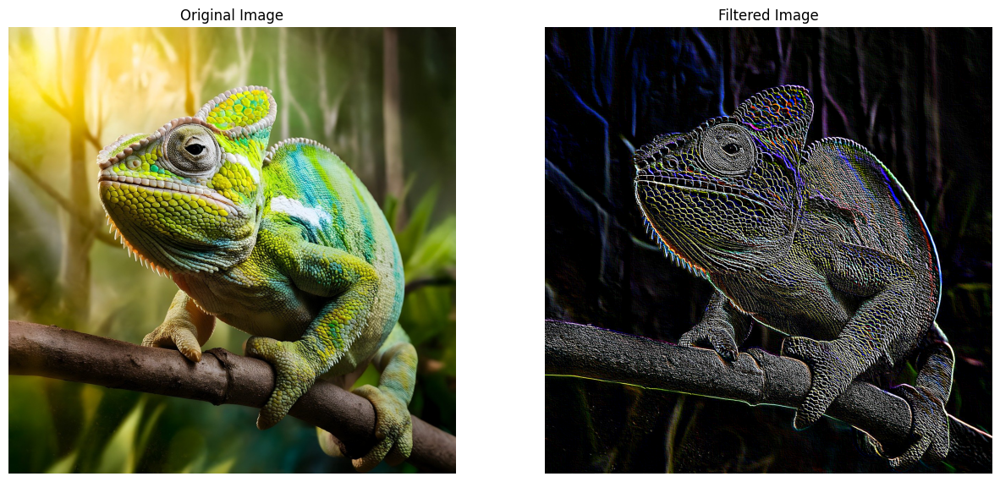

In [40]:
# test embossed edge setection
img = img1
img_emboss = embossed_edges(img)
cv2.imwrite('filtered_image.png', img_emboss)
plot(img, img_emboss)

## Improving Exposure

In [41]:
# calculates absolute values, and converts the result to 8-bit
def bright(img, level):
    img_bright = cv2.convertScaleAbs(img, beta = level)
    return img_bright

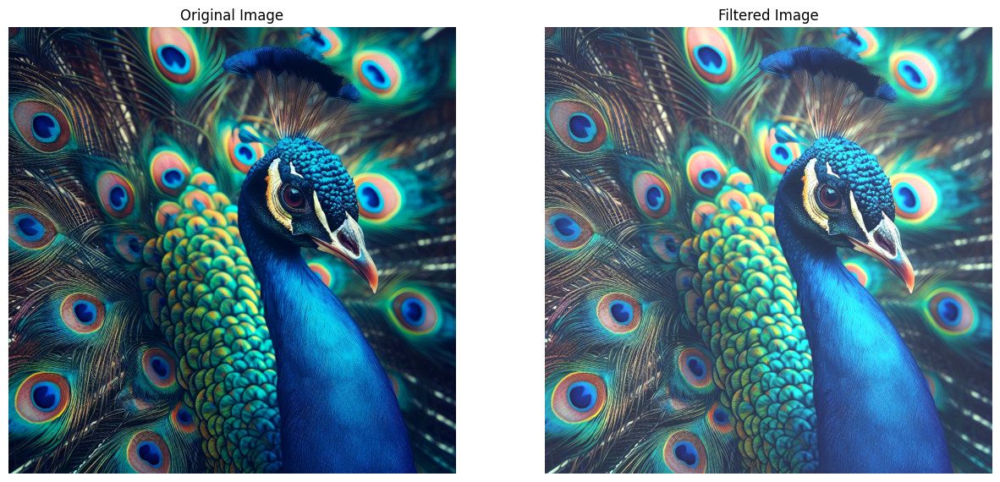

In [50]:
# test exposure
img = img2
img_bright = bright(img, 40)
plot(img, img_bright)

## Outline Filter

In [51]:
# fuction to detect outline
def outline(img, k = 9):
    
    k = max(k,9)
    kernel = np.array([[-1, -1, -1],
                       [-1,  k, -1],
                       [-1, -1, -1]])
    
    img_outline = cv2.filter2D(img, ddepth = -1, kernel = kernel)

    return img_outline

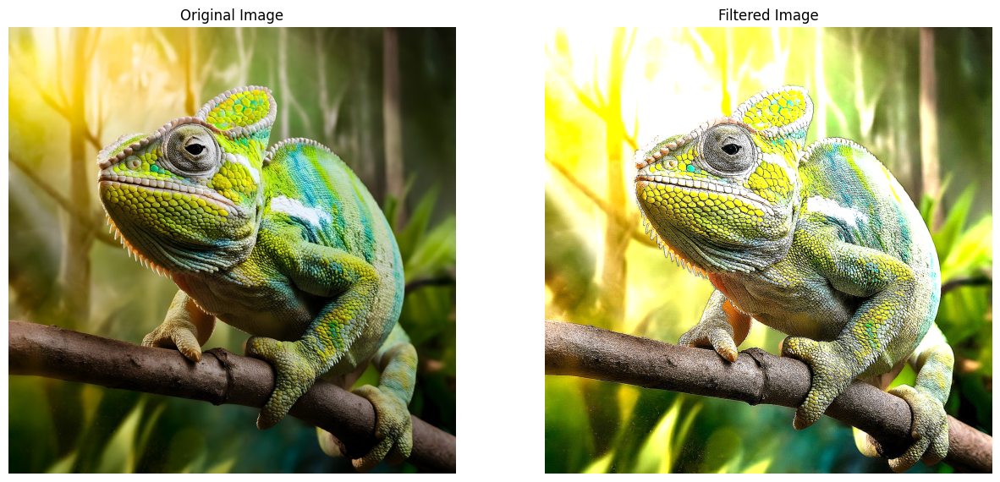

In [56]:
# test outline detection
img = img1
img_outline = outline(img, k = 10)
plot(img, img_outline)

## Pencil Sketch Filter

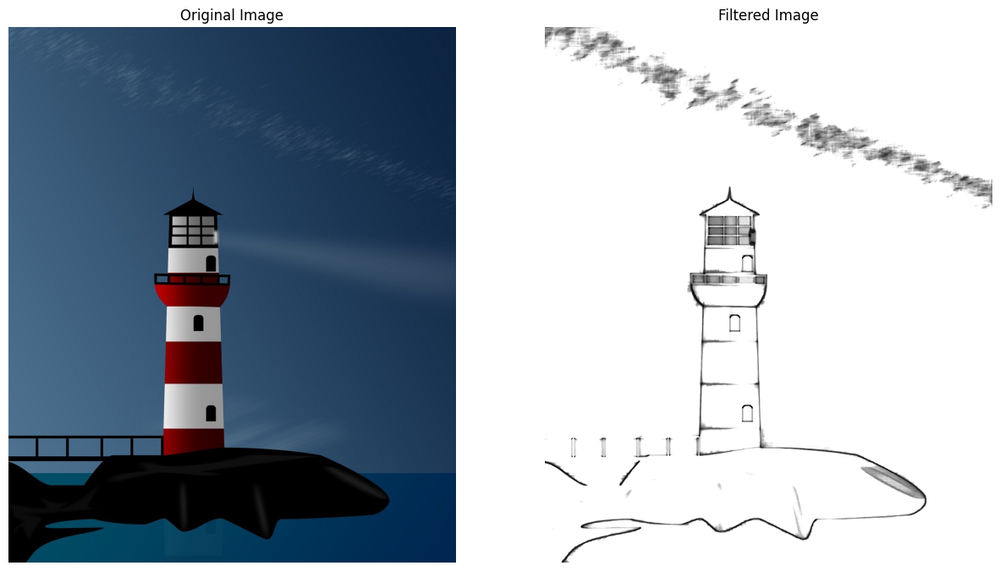

In [60]:
# Create pencil sketch
img = img3
img_blur = cv2.GaussianBlur(img, (5,5), 0, 0)
img_sketch_bw, _ = cv2.pencilSketch(img_blur)
plot(img, img_sketch_bw)

## Stylization Filter

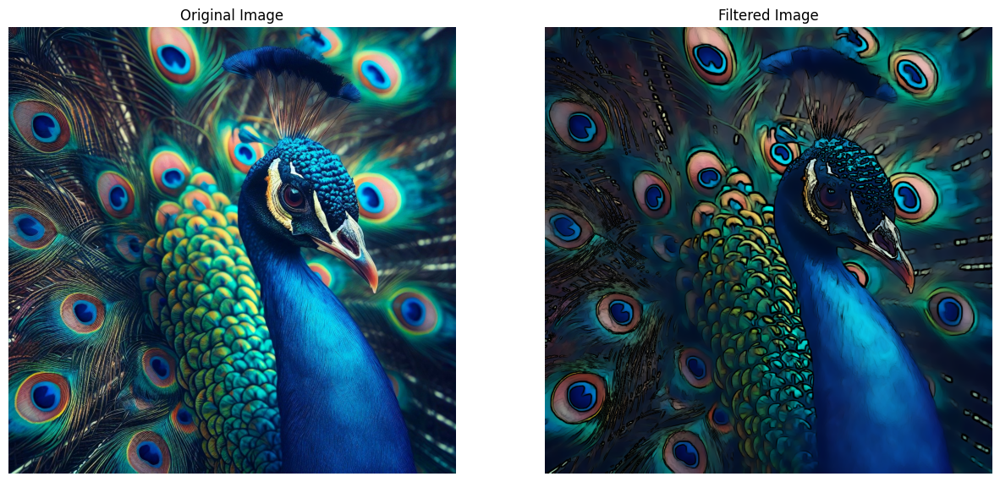

In [65]:
# stylization
img = img2
img_blur = cv2.GaussianBlur(img, (5,5), 0, 0)
img_style = cv2.stylization(img_blur, sigma_s = 10, sigma_r = 0.3)
#cv2.imwrite
plot(img, img_style)

## Image Sharpening

In [66]:
# sharpen an image with the following 2D-convolution kernel
def sharping_filter(img, k=5):
    kernel = np.array([[ 0, -1,  0],
                       [-1,  k, -1],
                       [ 0, -1,  0]])
    img_sharp = cv2.filter2D(img, ddepth = -1, kernel = kernel)
    # Clip values to the range [0, 255].
    img_sharp = np.clip(img_sharp, 0, 255)
    return img_sharp

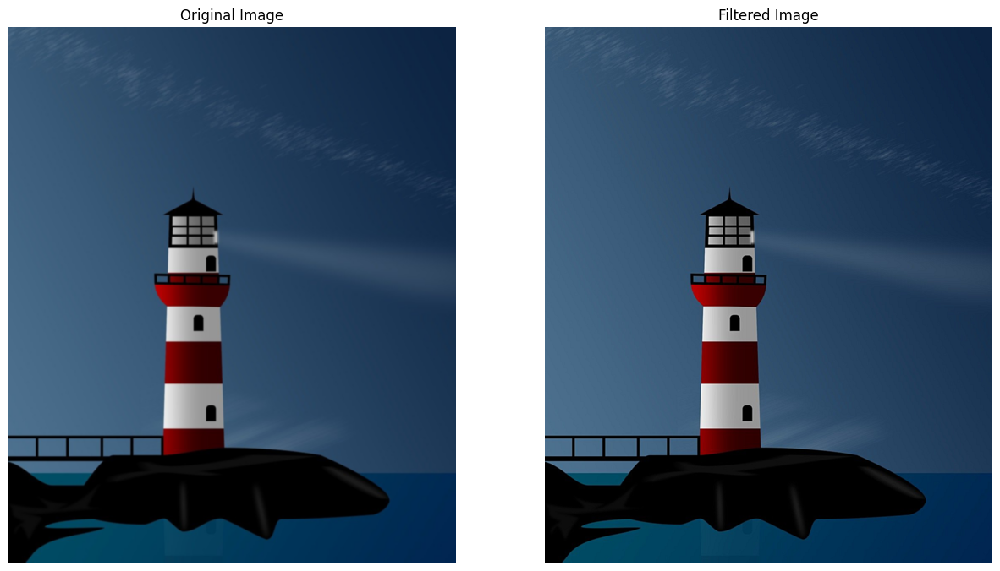

In [67]:
# test image sharpen
img = img3
img_blur = cv2.GaussianBlur(img, (5,5), 0, 0)
img_sharp = sharping_filter(img_blur)
plot(img_blur, img_sharp)